In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from natsort import natsorted
import matplotlib.pyplot as plt
import decoupler as dc

sns.set_context("paper", font_scale=2) # set some nice global plotting settings.

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
tissue = 'GonadsMale'

In [3]:
plate_palette = sns.color_palette("husl", n_colors=3)
sex_palette = ['dodgerblue']
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


In [4]:
adata = sc.read_h5ad(f'../IGVF_analysis/cellbender_tissues/{tissue}_processed_subclustered.h5ad')



In [5]:
adata

AnnData object with n_obs × n_vars = 383238 × 56953
    obs: 'lab_sample_id', 'sample', 'plate', 'subpool', 'SampleType', 'Tissue', 'Sex', 'Age', 'Genotype', 'subpool_type', 'Protocol', 'Chemistry', 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'bc1_well', 'bc2_well', 'bc3_well', 'Row', 'Column', 'well_type', 'Mouse_Tissue_ID', 'Multiplexed_sample1', 'Multiplexed_sample2', 'DOB', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'ZT', 'Dissector', 'Tissue_weight_mg', 'Notes', 'n_genes_by_counts_raw', 'total_counts_raw', 'total_counts_mt_raw', 'pct_counts_mt_raw', 'n_genes_by_counts_cb', 'total_counts_cb', 'total_counts_mt_cb', 'pct_counts_mt_cb', 'doublet_score', 'predicted_doublet', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'leiden', 'leiden_R'
    var: 'gene_id', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_R', 'log1p', 'neighbors', 'umap'

In [6]:
adata.obs.head()

,lab_sample_id,sample,plate,subpool,SampleType,Tissue,Sex,Age,Genotype,subpool_type,...,total_counts_mt_cb,pct_counts_mt_cb,doublet_score,predicted_doublet,background_fraction,cell_probability,cell_size,droplet_efficiency,leiden,leiden_R
cellID,,,,,,,,,,,,,,,,,,,,,
A2_D1_B3_Subpool_4_igvf_008b,017_B6J_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,B6J,NO,...,22.0,0.014818,0.113990,False,0.000182,0.999955,61647.804688,2.417991,2,2
D2_H12_C11_Subpool_4_igvf_008b,077_PWKJ_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,PWKJ,NO,...,64.0,0.043370,0.121387,False,0.000088,0.999955,61499.597656,2.409066,15,15_0
E2_B9_A5_Subpool_4_igvf_008b,037_129S1J_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,129S1J,NO,...,27.0,0.018344,0.075426,False,0.000136,0.999955,61264.152344,2.412289,2,2
B8_D4_F4_Subpool_4_igvf_008b,073_NODJ_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,NODJ,NO,...,46.0,0.031267,0.081571,False,0.000204,0.999955,60660.339844,2.435667,2,2
D2_A4_G12_Subpool_4_igvf_008b,077_PWKJ_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,PWKJ,NO,...,24.0,0.016587,0.085339,False,0.000104,0.999955,60179.664062,2.414079,15,15_0


In [7]:
adata.var.head()

,gene_id,gene_name,mt,highly_variable,means,dispersions,dispersions_norm
gene_name,,,,,,,
4933401J01Rik,ENSMUSG00000102693.2,4933401J01Rik,False,False,0.000692,2.042077,0.050606
Gm26206,ENSMUSG00000064842.3,Gm26206,False,False,0.000002,-0.345574,-2.553114
Xkr4,ENSMUSG00000051951.6,Xkr4,False,True,0.160424,2.997728,1.092739
Gm18956,ENSMUSG00000102851.2,Gm18956,False,False,0.000224,2.567143,0.623188
Gm37180,ENSMUSG00000103377.2,Gm37180,False,False,0.002449,2.248856,0.276098


In [4]:
def stacked_barplot_proportions(adata, cluster_key, var_key, fsize=(12, 6), annotations=True, reverse_order=False, custom_order=None, custom_colors=None):
    colors = sns.color_palette("husl", n_colors=len(adata[var_key].unique()))

    # Group the data by 'cluster_key' and 'var_key', count occurrences, and calculate proportions
    grouped_data = adata.groupby([cluster_key, var_key]).size().unstack().fillna(0)
    proportions = grouped_data.div(grouped_data.sum(axis=1), axis=0)

    # Apply custom order if provided
    if custom_order:
        proportions = proportions.loc[custom_order]
    if custom_colors:
        colors = custom_colors

    # Reverse the order of the DataFrame if reverse_order is True
    if reverse_order:
        proportions = proportions.iloc[::-1]
        m = adata.groupby([cluster_key]).size().to_frame().iloc[::-1]
    else:
        m = adata.groupby([cluster_key]).size().to_frame()

    #sns.set_style('white')
    # Create the stacked bar plot
    ax = proportions.plot(kind='barh', color=colors, stacked=True, figsize=fsize, width=0.8, edgecolor=None)

    if annotations:
        for i, txt in enumerate(m[0]):
            ax.text(0.875, i, txt, fontsize=14, va='center', transform=ax.get_yaxis_transform())

    plt.xlim(0, 1.15)
    ax.tick_params(axis="x", labelsize=14)
    ax.tick_params(axis="y", labelsize=14)
    ax.set_xlabel("Proportion")
    ax.set_ylabel(cluster_key)
    ax.set_title(f'{var_key} by {cluster_key}')

    if annotations:
        ax.legend(title=var_key, bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        ax.get_legend().remove()

    ax.grid(False)
    
    plt.show()

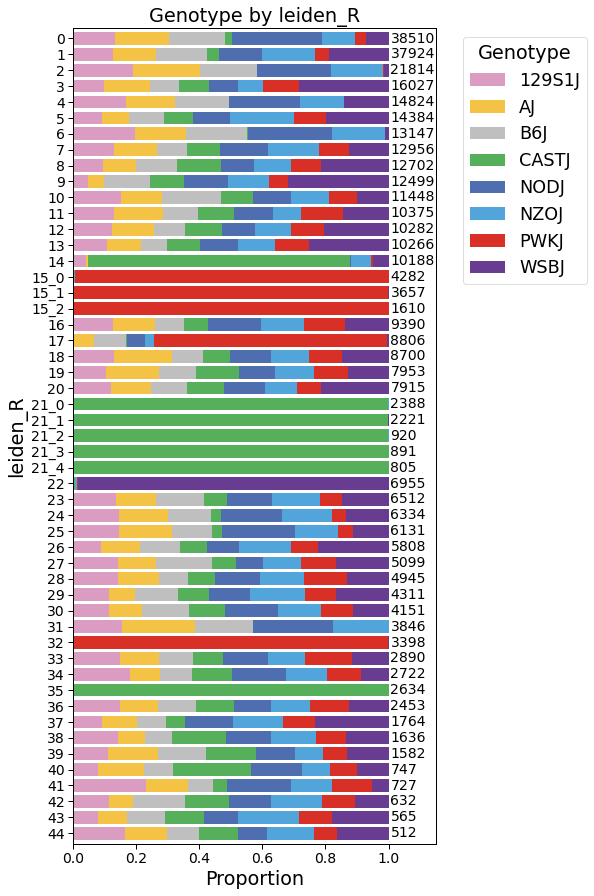

In [9]:
stacked_barplot_proportions(adata.obs, 
                            'leiden_R', 'Genotype',
                            reverse_order = True,
                            fsize = (6.5,15), 
                            custom_colors = geno_palette,
                            annotations = True)


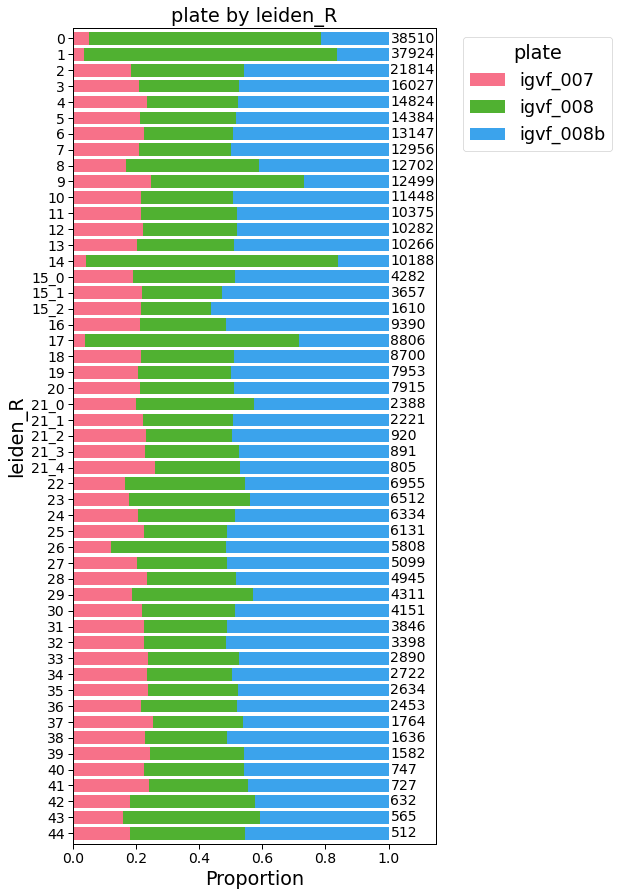

In [10]:
stacked_barplot_proportions(adata.obs, 
                            'leiden_R', 'plate',
                            reverse_order = True,
                            fsize = (6.5,15), 
                            custom_colors = plate_palette,
                            annotations = True)


In [11]:
marker_genes_dict = {
    "Spermatogonia":["Tex15","Dmrt1","Morc1","Dazl","Sycp3"],
    "Spermatocyte":["Tex14","Sycp1","Sycp2","Spata16","Ybx2","Piwil1"],
    "Round_spermatid":["Acrv1","Spaca3","Spaca4"],
    "Elongating_spermatid":["Prm1","Prm2","Tnp1","Spata3","Tssk6"],
    "Spermatozoa": ['Tnp1','Tnp2','Prm2'],
    
    
    "Principal_cells": ["Spink8","Pax8"],
    "Efferent_duct": ["Vil1","Esr1"],
    "Initial_segment": ["Lcn9","Lcn8"],
    "Caput": ["Lcn2"],
    "Corpus": ["Defb23","Rnase9","Lcn5"],
    "Cauda":["Wfdc10","Ptgds","Serpine2"],
    "Leydig": ["Cyp17a1","Hsd17b11","Hsd3b6","Vcam1"],     
    "Sertoli": ["Kitl","Wt1","Sox9"],
    "Basal": ['Krt5','Cldn1','Ptgs1','Cd9'],
    "Clear": ["Atp6v1e1","Foxi1"],
    "Narrow": ["Car2"],
    
    
    "Stromal": ["Cd34","Col1a2","Gsn"],
    "Fibroblast": ["Dcn","Col4a4","Lama2"],
    "Endothelial": ["Flt1","Pecam1","Tek","Kdr"],
    "Macrophage": ["Adgre1","F13a1"],
    "Smooth_muscle": ["Myh11","Acta2","Myl9"],
    "Adipocyte": ["Adipoq","Pnpla2","Pparg"],
    "Unknown": ["Muc16","Gpm6a","Flrt2",
                "Efemp1","Col3a1","Plxna4","Cdh11",
                "Pkhd1l1","Igfbp5","C3","Il16"],
    "Other": ["Xist","Myh11","Myl9"]
               
}


categories: 0, 1, 2, etc.
var_group_labels: Spermatogonia, Spermatocyte, Round_spermatid, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


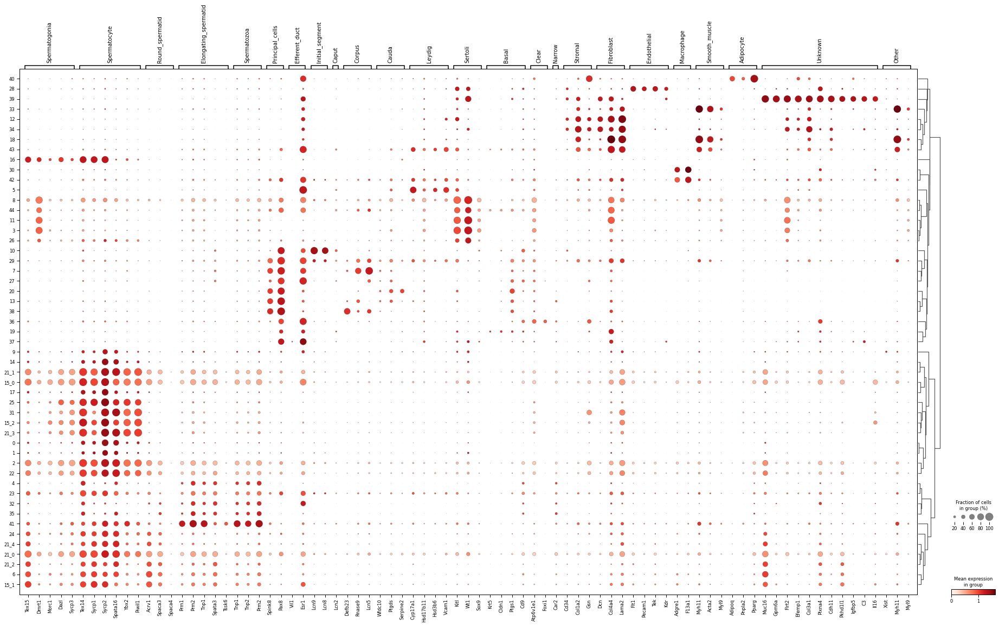

In [12]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden_R', mean_only_expressed = True,
              dendrogram=True, log=True)


In [13]:
#https://www.nature.com/articles/s41598-018-24725-0
marker_genes_dict = {
    "Spermatogonia":["Esx1","Rad21","Dazl","Crabp1","Stra8"],
    "Spermatocyte":["Zfp35","Tdrd1","Prss44","Prss43","Prss42","Pou5f2","Piwil2","Meioc","Hormad2","Hormad1","Meiob"],
    "Spermatid":["Tnp2","Tnp1","Hspa1l","Prm1","Dyrk4"],
    "Spermatozoa": ['Prm1','Prm2'],

               
}


categories: 0, 1, 2, etc.
var_group_labels: Spermatogonia, Spermatocyte, Spermatid, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


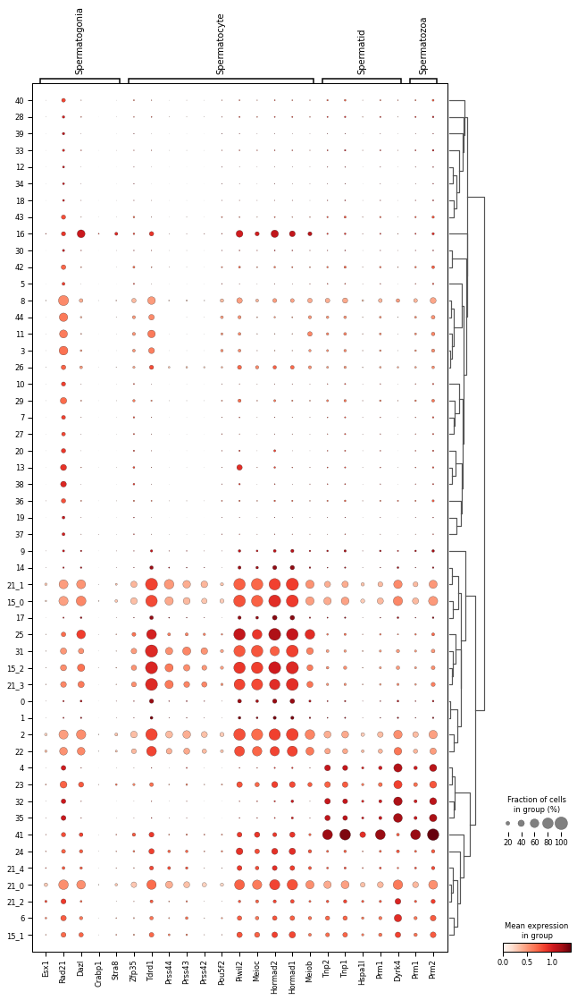

In [14]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden_R', mean_only_expressed = True,
              dendrogram=True, log=True)


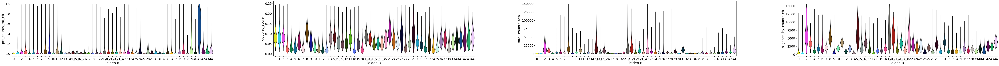

In [17]:
plt.rcParams['figure.figsize'] = (16, 6)

sc.pl.violin(adata, ['pct_counts_mt_cb', 'doublet_score', 'total_counts_raw', 'n_genes_by_counts_cb'],
             groupby = "leiden_R", 
             jitter=0.4, multi_panel=True, size=0)

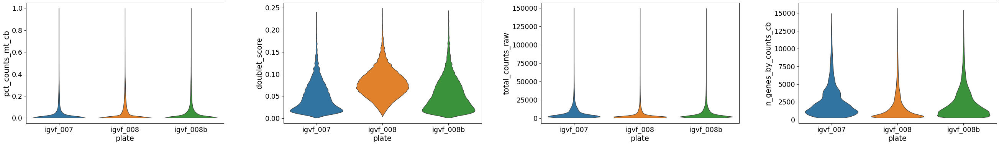

In [18]:
plt.rcParams['figure.figsize'] = (8, 6)

sc.pl.violin(adata, ['pct_counts_mt_cb', 'doublet_score', 'total_counts_raw', 'n_genes_by_counts_cb'],
             groupby = "plate", 
             jitter=0.4, multi_panel=True, size=0)

In [19]:
plt.rcParams['figure.figsize'] = (8, 8)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


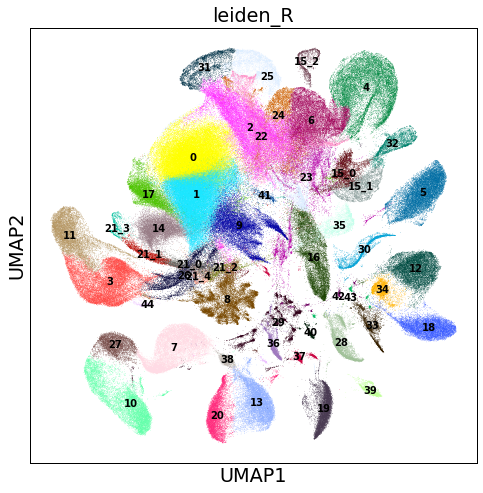

In [20]:
sc.pl.umap(adata, color=['leiden_R'], size=1, legend_fontsize = 10, legend_loc = 'on data')


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


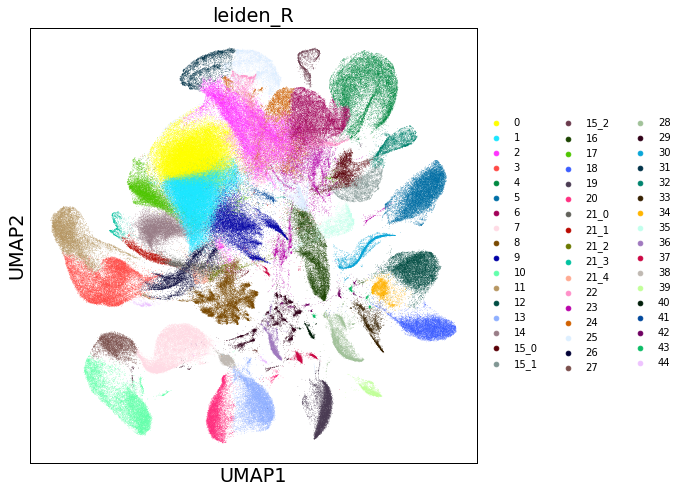

In [50]:
sc.pl.umap(adata, color=['leiden_R'], size=1, legend_fontsize = 10)

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


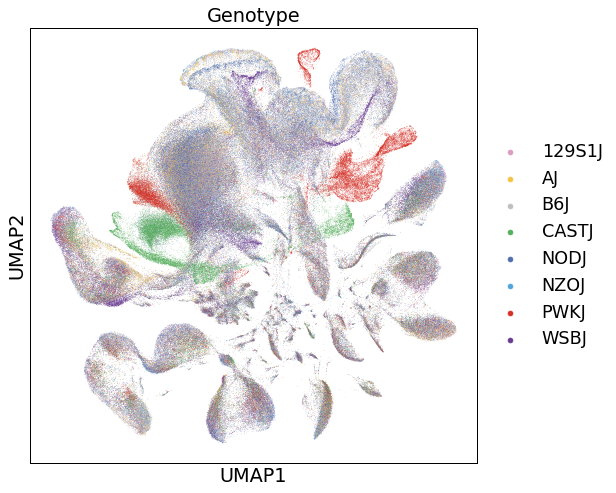

In [21]:
sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


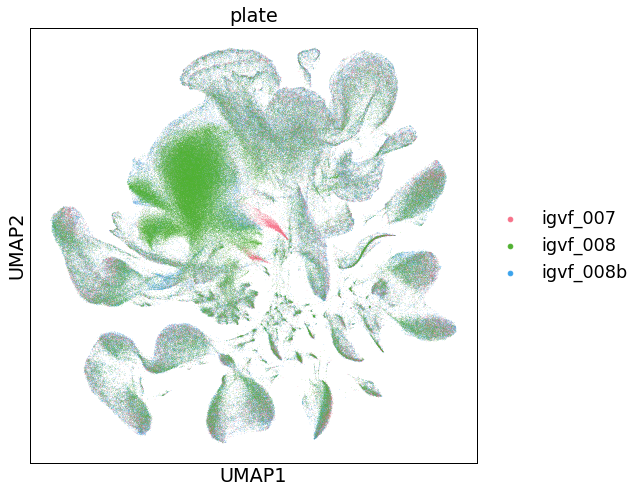

In [22]:
sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)


In [23]:
adata

AnnData object with n_obs × n_vars = 383238 × 56953
    obs: 'lab_sample_id', 'sample', 'plate', 'subpool', 'SampleType', 'Tissue', 'Sex', 'Age', 'Genotype', 'subpool_type', 'Protocol', 'Chemistry', 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'bc1_well', 'bc2_well', 'bc3_well', 'Row', 'Column', 'well_type', 'Mouse_Tissue_ID', 'Multiplexed_sample1', 'Multiplexed_sample2', 'DOB', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'ZT', 'Dissector', 'Tissue_weight_mg', 'Notes', 'n_genes_by_counts_raw', 'total_counts_raw', 'total_counts_mt_raw', 'pct_counts_mt_raw', 'n_genes_by_counts_cb', 'total_counts_cb', 'total_counts_mt_cb', 'pct_counts_mt_cb', 'doublet_score', 'predicted_doublet', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'leiden', 'leiden_R'
    var: 'gene_id', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_R', 'log1p', 'neighbors', 'umap'

In [24]:
plt.rcParams['figure.figsize'] = (8, 8)


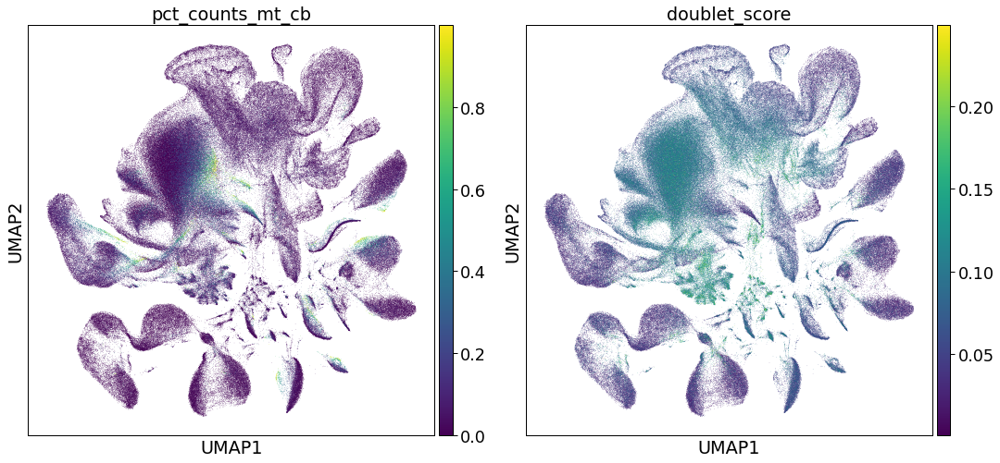

In [25]:
sc.pl.umap(adata, color=['pct_counts_mt_cb','doublet_score'], size = 0.8, palette = plate_palette)


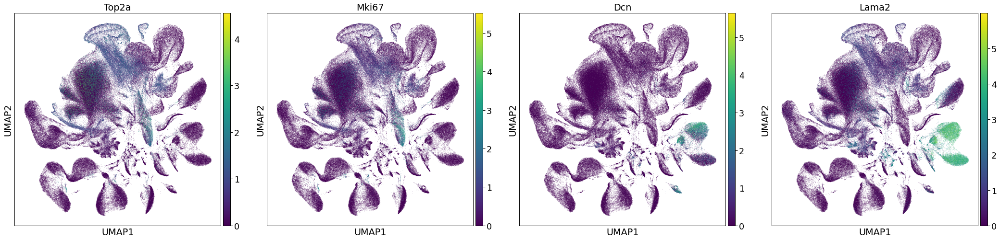

In [26]:
sc.pl.umap(adata, color=['Top2a','Mki67','Dcn','Lama2'], size=1, sort_order = True)

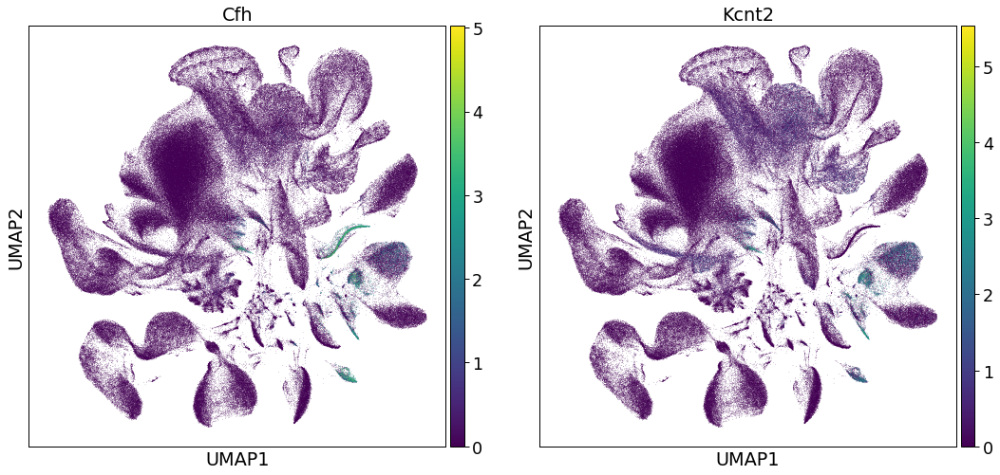

In [27]:
sc.pl.umap(adata, color=['Cfh','Kcnt2'], size=1, sort_order = True)

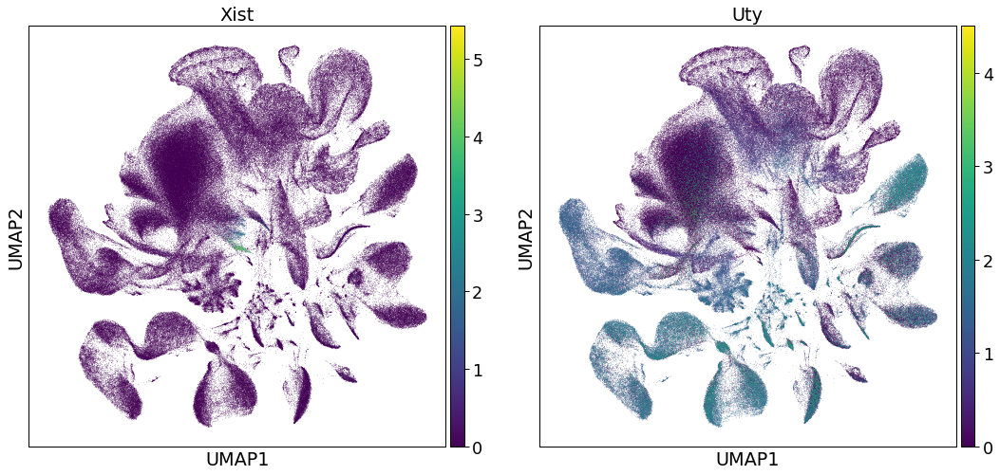

In [28]:
sc.pl.umap(adata, color=['Xist','Uty'], size=1, sort_order = True)

In [29]:
adata

AnnData object with n_obs × n_vars = 383238 × 56953
    obs: 'lab_sample_id', 'sample', 'plate', 'subpool', 'SampleType', 'Tissue', 'Sex', 'Age', 'Genotype', 'subpool_type', 'Protocol', 'Chemistry', 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'bc1_well', 'bc2_well', 'bc3_well', 'Row', 'Column', 'well_type', 'Mouse_Tissue_ID', 'Multiplexed_sample1', 'Multiplexed_sample2', 'DOB', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'ZT', 'Dissector', 'Tissue_weight_mg', 'Notes', 'n_genes_by_counts_raw', 'total_counts_raw', 'total_counts_mt_raw', 'pct_counts_mt_raw', 'n_genes_by_counts_cb', 'total_counts_cb', 'total_counts_mt_cb', 'pct_counts_mt_cb', 'doublet_score', 'predicted_doublet', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'leiden', 'leiden_R'
    var: 'gene_id', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_R', 'log1p', 'neighbors', 'umap'

In [30]:
old_annots = pd.read_csv(f'../IGVF_analysis/annotated_tissues/{tissue}_annotated_metadata.csv')
old_annots['subpool'] = old_annots['subpool'].str.replace(r'Sublibrary_(\d+)', r'Subpool_\1', regex=True)

subpool_mapping = {
    "13A": "Subpool_1",
    "13B": "Subpool_2",
    "13C": "Subpool_3",
    "13D": "Subpool_4",
    "13E": "Subpool_5",
    "13F": "Subpool_6",
    "13G": "Subpool_7",
    "13H": "Subpool_8"
}

# Update the subpool column for the specified plate
old_annots.loc[old_annots['plate'] == 'igvf_012', 'subpool'] = (
    old_annots['subpool'].map(subpool_mapping)
)


old_annots['cellID'] = old_annots['bc1_well'] + "_" + old_annots['bc2_well'] + "_" + old_annots['bc3_well'] + "_" + old_annots['subpool']  + "_" + old_annots['plate'] 



/tmp/ipykernel_3669532/134062919.py:1: DtypeWarning: Columns (12,13,31,36,37,40,41,42,61) have mixed types. Specify dtype option on import or set low_memory=False.
  old_annots = pd.read_csv(f'../IGVF_analysis/annotated_tissues/{tissue}_annotated_metadata.csv')


In [31]:
new_cells = adata.obs.index.tolist()
old_cells = old_annots['cellID'].tolist()

new_cells_series = pd.Series(new_cells)
old_cells_series = pd.Series(old_cells)


old_in_new = old_cells_series.isin(new_cells)
new_in_old = new_cells_series.isin(old_cells)


old_not_in_new = old_cells_series[~old_in_new]
new_not_in_old = new_cells_series[~new_in_old]

print(f"Number of old_cells not in new_cells: {len(old_not_in_new)}")

print(f"Number of new_cells not in old_cells: {len(new_not_in_old)}")


Number of old_cells not in new_cells: 4014
Number of new_cells not in old_cells: 131162


In [32]:
old_annots.set_index('cellID', inplace=True)
transfer_df = old_annots[['subtype', 'celltype']]

adata_obs = adata.obs.copy()

# Merge the dataframes, adding the 'subtype' and 'celltype' columns to adata.obs
adata_obs = adata_obs.join(transfer_df, how='left')


In [33]:
# Ensure missing values are explicitly set as NA
adata_obs['subtype'].fillna(value="NA", inplace=True)
adata_obs['celltype'].fillna(value="NA", inplace=True)

In [34]:
adata_obs.head()

,lab_sample_id,sample,plate,subpool,SampleType,Tissue,Sex,Age,Genotype,subpool_type,...,doublet_score,predicted_doublet,background_fraction,cell_probability,cell_size,droplet_efficiency,leiden,leiden_R,subtype,celltype
cellID,,,,,,,,,,,,,,,,,,,,,
A2_D1_B3_Subpool_4_igvf_008b,017_B6J_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,B6J,NO,...,0.113990,False,0.000182,0.999955,61647.804688,2.417991,2,2,spermatid,spermatid
D2_H12_C11_Subpool_4_igvf_008b,077_PWKJ_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,PWKJ,NO,...,0.121387,False,0.000088,0.999955,61499.597656,2.409066,15,15_0,spermatid,spermatid
E2_B9_A5_Subpool_4_igvf_008b,037_129S1J_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,129S1J,NO,...,0.075426,False,0.000136,0.999955,61264.152344,2.412289,2,2,spermatid,spermatid
B8_D4_F4_Subpool_4_igvf_008b,073_NODJ_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,NODJ,NO,...,0.081571,False,0.000204,0.999955,60660.339844,2.435667,2,2,spermatid,spermatid
D2_A4_G12_Subpool_4_igvf_008b,077_PWKJ_10M_25,NA,igvf_008b,Subpool_4,Nuclei,GonadsMale,Male,PNM_02,PWKJ,NO,...,0.085339,False,0.000104,0.999955,60179.664062,2.414079,15,15_0,spermatid,spermatid


In [35]:
adata.obs['celltype_carryover'] = adata_obs['celltype']
adata.obs['subtype_carryover'] = adata_obs['subtype']

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


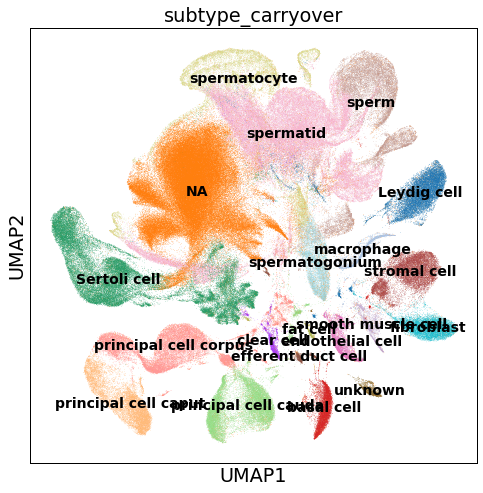

In [36]:
sc.pl.umap(adata, color=['subtype_carryover'], size = 1, legend_fontsize = 14, legend_loc = "on data")


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


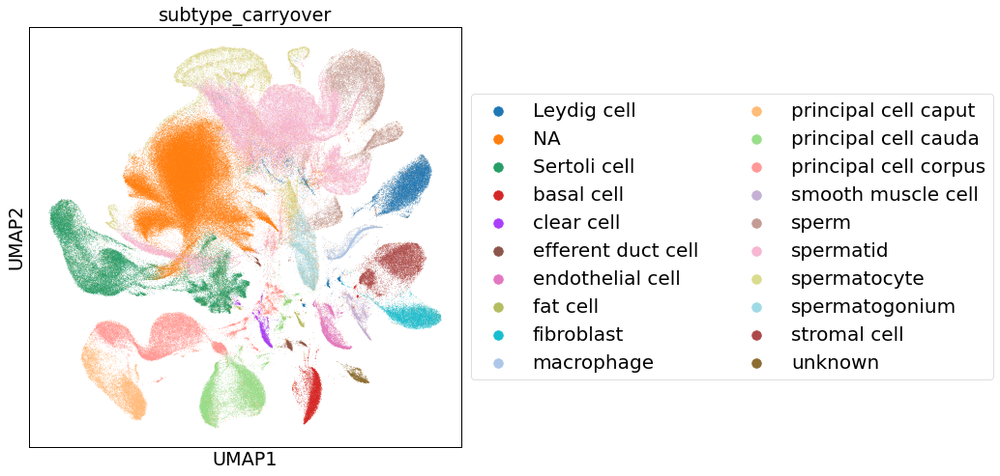

In [37]:
# Plot UMAP
ax = sc.pl.umap(adata, color=['subtype_carryover'], size=1, legend_fontsize=20, show=False)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), markerscale=2, fontsize=20, ncol=2)
plt.show()

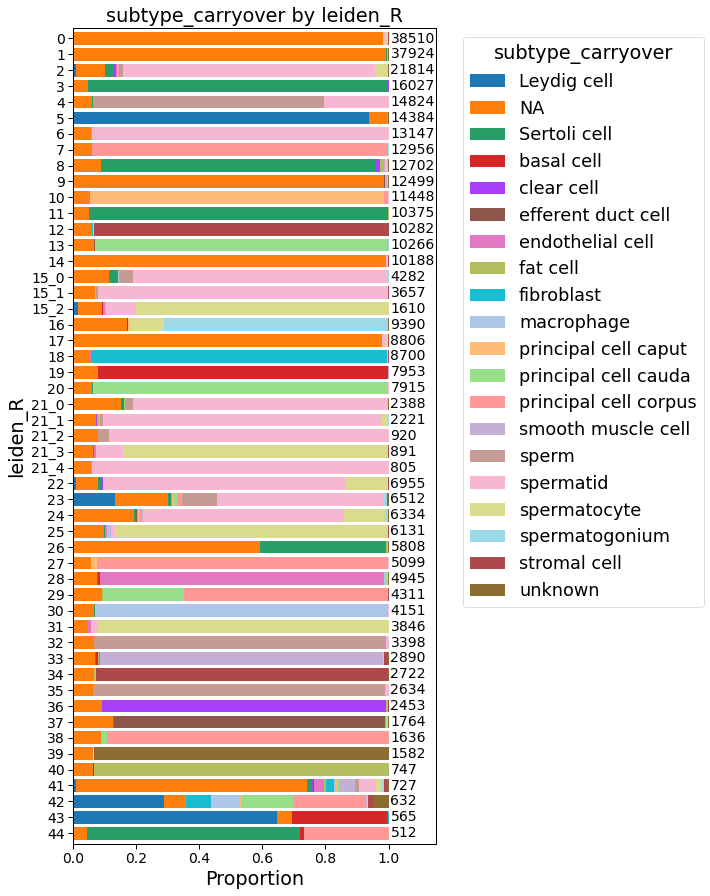

In [38]:
stacked_barplot_proportions(adata.obs, 
                            'leiden_R', 'subtype_carryover',
                            reverse_order = True,
                            custom_colors = adata.uns["subtype_carryover_colors"],
                            fsize = (6.5,15), 
                            annotations = True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


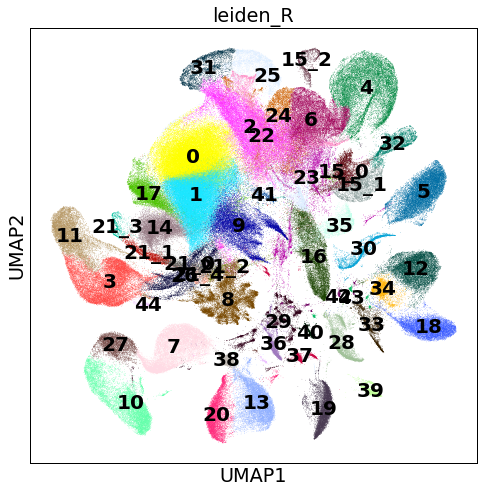

In [39]:
sc.pl.umap(adata, color=['leiden_R'], size=1, legend_fontsize = 20, legend_loc = 'on data')


In [40]:
adata.uns['log1p']["base"] = None # probably have to run this line, known scanpy bug.. https://github.com/scverse/scanpy/issues/2239#issuecomment-1104178881 


In [48]:
sc.tl.rank_genes_groups(adata, groupby="leiden_R", method="t-test")


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragme

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


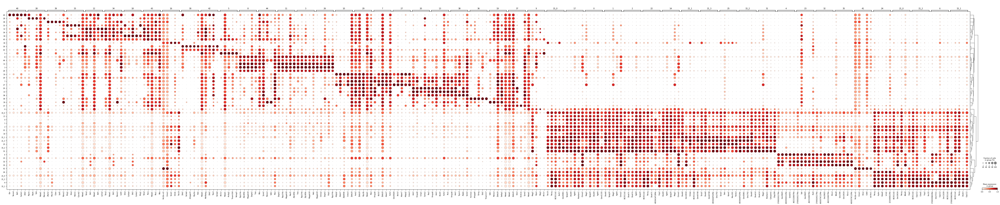

In [49]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_R", standard_scale="var", n_genes=5
)

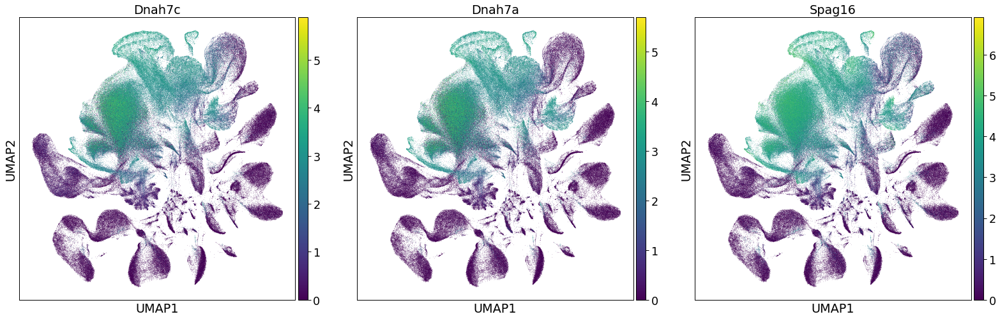

In [50]:
sc.pl.umap(adata, color=['Dnah7c','Dnah7a','Spag16'], size=1, sort_order = True)

# Annotate

In [57]:
annots = pd.read_csv("post_cellbender_annotations.csv")
annots = annots[annots['tissue'] == tissue]
annots['leiden_R'] = annots['leiden_R'].astype(str)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['general_celltype'].to_dict()
adata.obs['general_celltype'] = adata.obs['leiden_R'].map(annotation_dict)
annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['general_CL_ID'].to_dict()
adata.obs['general_CL_ID'] = adata.obs['leiden_R'].map(annotation_dict)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['celltype'].to_dict()
adata.obs['celltype'] = adata.obs['leiden_R'].map(annotation_dict)
annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['CL_ID'].to_dict()
adata.obs['CL_ID'] = adata.obs['leiden_R'].map(annotation_dict)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['subtype'].to_dict()
adata.obs['subtype'] = adata.obs['leiden_R'].map(annotation_dict)



In [58]:
plt.rcParams['figure.figsize'] = (8, 8)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


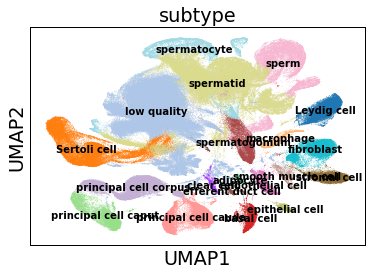

In [10]:
sc.pl.umap(adata, color=['subtype'], size=1, legend_fontsize = 10, legend_loc = 'on data')


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


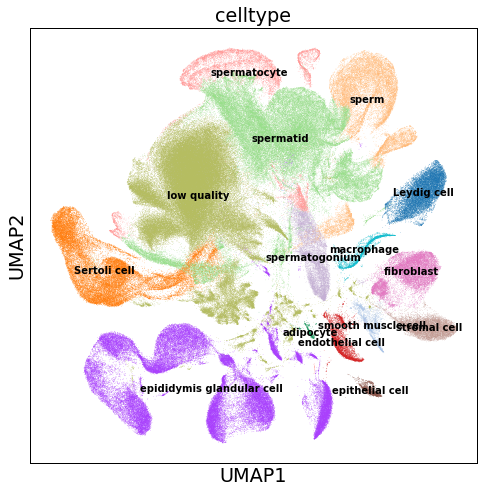

In [60]:
sc.pl.umap(adata, color=['celltype'], size=1, legend_fontsize = 10, legend_loc = 'on data')


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


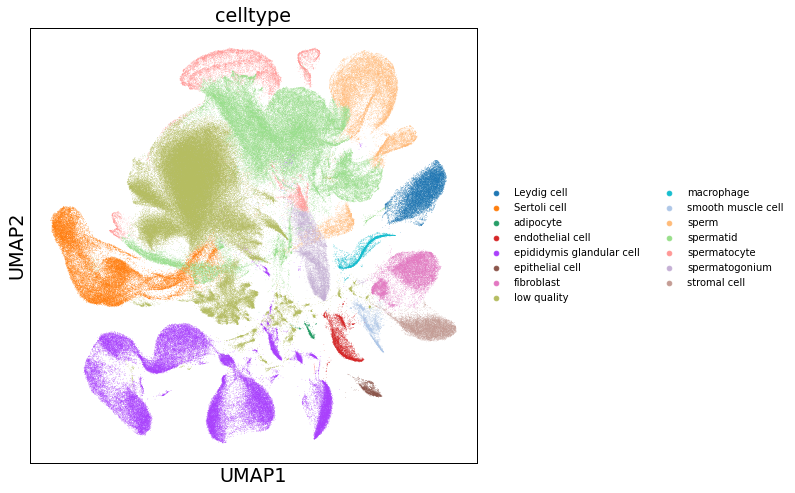

In [61]:
sc.pl.umap(adata, color=['celltype'], size=1, legend_fontsize = 10)

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


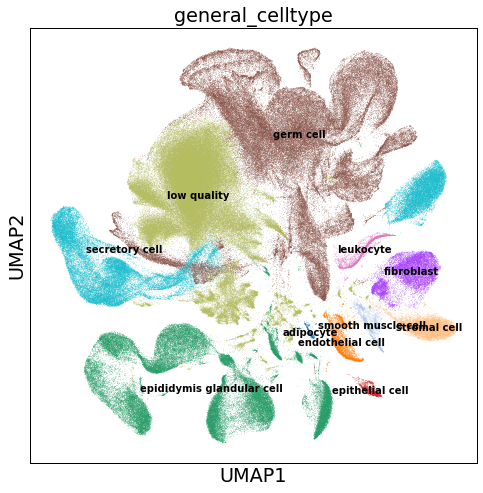

In [62]:
sc.pl.umap(adata, color=['general_celltype'], size=1, legend_fontsize = 10, legend_loc = 'on data')


In [47]:
adata.obs.drop(columns='celltype_carryover', inplace=True)
adata.obs.drop(columns='subtype_carryover', inplace=True)

In [63]:
adata

AnnData object with n_obs × n_vars = 383238 × 56953
    obs: 'lab_sample_id', 'sample', 'plate', 'subpool', 'SampleType', 'Tissue', 'Sex', 'Age', 'Genotype', 'subpool_type', 'Protocol', 'Chemistry', 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'bc1_well', 'bc2_well', 'bc3_well', 'Row', 'Column', 'well_type', 'Mouse_Tissue_ID', 'Multiplexed_sample1', 'Multiplexed_sample2', 'DOB', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'ZT', 'Dissector', 'Tissue_weight_mg', 'Notes', 'n_genes_by_counts_raw', 'total_counts_raw', 'total_counts_mt_raw', 'pct_counts_mt_raw', 'n_genes_by_counts_cb', 'total_counts_cb', 'total_counts_mt_cb', 'pct_counts_mt_cb', 'doublet_score', 'predicted_doublet', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'leiden', 'leiden_R', 'general_celltype', 'general_CL_ID', 'celltype', 'CL_ID', 'subtype'
    var: 'gene_id', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_nor

In [64]:
meta = adata.obs
meta.to_csv(f"../IGVF_analysis/cellbender_tissues/obs_tables/{tissue}_annotated_metadata.csv")


In [65]:
adata.write_h5ad(f'../IGVF_analysis/cellbender_tissues/{tissue}_annotated.h5ad')


In [5]:
adata = sc.read_h5ad(f'../IGVF_analysis/cellbender_tissues/annotated/{tissue}_annotated.h5ad')


In [6]:
plate_palette = sns.color_palette("husl", n_colors=3)
sex_palette = ['hotpink','dodgerblue']
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


In [12]:
adata

AnnData object with n_obs × n_vars = 383238 × 56953
    obs: 'lab_sample_id', 'sample', 'plate', 'subpool', 'SampleType', 'Tissue', 'Sex', 'Age', 'Genotype', 'subpool_type', 'Protocol', 'Chemistry', 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'bc1_well', 'bc2_well', 'bc3_well', 'Row', 'Column', 'well_type', 'Mouse_Tissue_ID', 'Multiplexed_sample1', 'Multiplexed_sample2', 'DOB', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'ZT', 'Dissector', 'Tissue_weight_mg', 'Notes', 'n_genes_by_counts_raw', 'total_counts_raw', 'total_counts_mt_raw', 'pct_counts_mt_raw', 'n_genes_by_counts_cb', 'total_counts_cb', 'total_counts_mt_cb', 'pct_counts_mt_cb', 'doublet_score', 'predicted_doublet', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'leiden', 'leiden_R', 'general_celltype', 'general_CL_ID', 'celltype', 'CL_ID', 'subtype'
    var: 'gene_id', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_nor

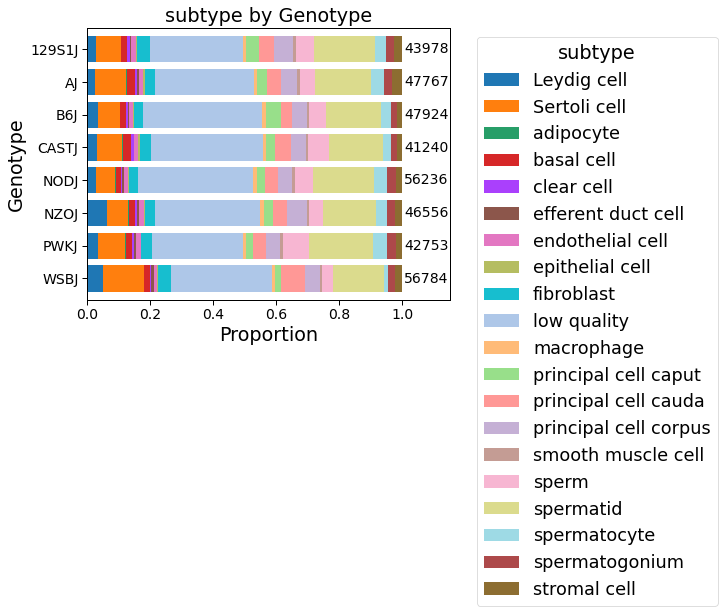

In [16]:
stacked_barplot_proportions(adata.obs, 
                            'Genotype', 'subtype',
                            reverse_order = True,
                            custom_colors = adata.uns["subtype_colors"].tolist(), #adata.uns["subtype_carryover_colors"],
                            fsize = (6.5,5), 
                            annotations = True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


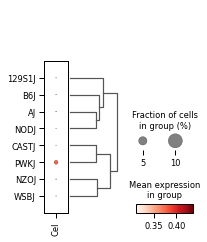

In [5]:
sc.pl.dotplot(adata, 'Cel', 'Genotype', mean_only_expressed = True,
              dendrogram=True, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


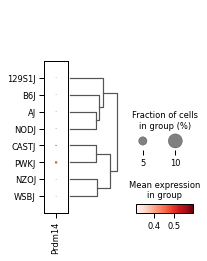

In [6]:
sc.pl.dotplot(adata, 'Prdm14', 'Genotype', mean_only_expressed = True,
              dendrogram=True, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


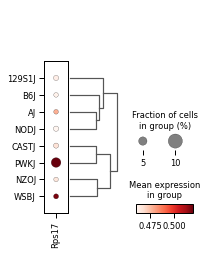

In [7]:
sc.pl.dotplot(adata, 'Rps17', 'Genotype', mean_only_expressed = True,
              dendrogram=True, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


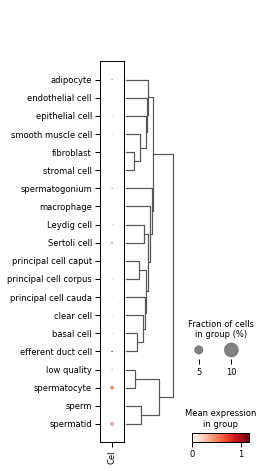

In [8]:
sc.pl.dotplot(adata, 'Cel', 'subtype', mean_only_expressed = True,
              dendrogram=True, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


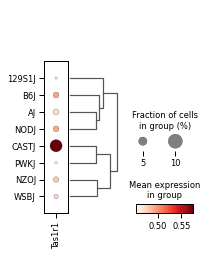

In [9]:
sc.pl.dotplot(adata, 'Tas1r1', 'Genotype', mean_only_expressed = True,
              dendrogram=True, log=True)


In [10]:
adata.obs['subtype_genotype'] = adata.obs['subtype'].astype(str) + "_" + adata.obs['Genotype'].astype(str)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


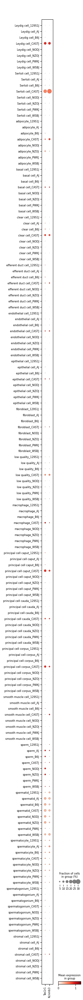

In [11]:
sc.pl.dotplot(adata, ['Tas1r1','Kcnmb3'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


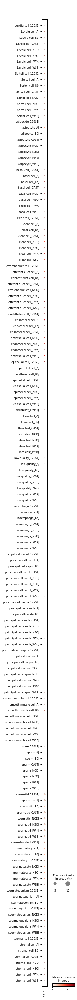

In [12]:
sc.pl.dotplot(adata, ['Tas1r3'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


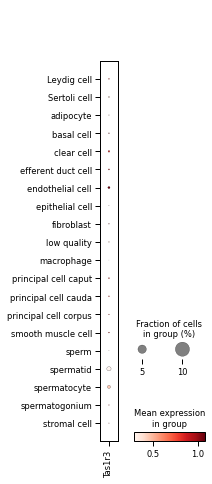

In [14]:
sc.pl.dotplot(adata, ['Tas1r3'], 'subtype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


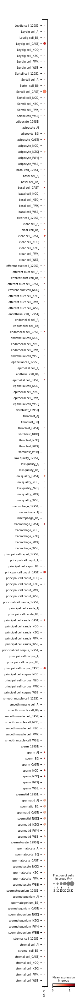

In [13]:
sc.pl.dotplot(adata, ['Tas1r1'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


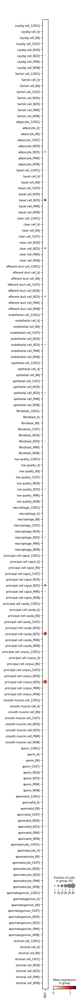

In [12]:
sc.pl.dotplot(adata, ['Gjb4'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


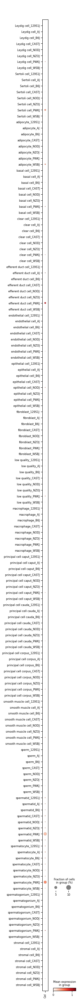

In [13]:
sc.pl.dotplot(adata, ['Cel'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)
